### Loading Packages and Data

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 8)

#import xarray as xr
import warnings
warnings.filterwarnings('ignore')
from matplotlib.backends.backend_pdf import PdfPages

from db_queries import get_outputs as go
from db_queries import get_ids
from get_draws.api import get_draws

In [2]:
ls /mnt/team/simulation_science/priv/engineering/vivarium_nih_us_cvd/21_mediation/alabama-vv-mediation/2023_10_13_16_37_35/count_data

binned_ldl_exposure_time.csv     risk_exposure_time.csv
binned_ldl_exposure_time.hdf     risk_exposure_time.hdf
binned_sbp_exposure_time.csv     sbp_medication_person_time.csv
binned_sbp_exposure_time.hdf     sbp_medication_person_time.hdf
deaths.csv                       state_person_time.csv
deaths.hdf                       state_person_time.hdf
healthcare_visits.csv            transition_count.csv
healthcare_visits.hdf            transition_count.hdf
intervention_person_time.csv     ylds.csv
intervention_person_time.hdf     ylds.hdf
ldlc_medication_person_time.csv  ylls.csv
ldlc_medication_person_time.hdf  ylls.hdf


In [3]:
sim_results_dir = '/mnt/team/simulation_science/priv/engineering/vivarium_nih_us_cvd/21_mediation/alabama-vv-mediation/2023_10_13_16_37_35/count_data'

## Checking Stability of Risks over Time

In [4]:
state_person_time = pd.read_csv(sim_results_dir + '/state_person_time.csv')
person_time = state_person_time.loc[state_person_time['state'].isin(["acute_ischemic_stroke", "chronic_ischemic_stroke", "susceptible_to_ischemic_stroke"])].reset_index() 
person_time = person_time.rename(columns = {'value':'ptvalue'})
per_time_group = person_time.groupby(['age', 'sex', 'year','input_draw','scenario']).ptvalue.sum().reset_index()
per_time_group.head()

,age,sex,year,input_draw,scenario,ptvalue
0,25_to_29,Female,2021,29,baseline,29561.943874
1,25_to_29,Female,2021,232,baseline,29333.190965
2,25_to_29,Female,2021,357,baseline,29487.890486
3,25_to_29,Female,2021,394,baseline,29370.907598
4,25_to_29,Female,2021,602,baseline,29263.277207


### BMI

In [5]:
risk_exp = pd.read_csv(sim_results_dir + '/risk_exposure_time.csv')
risk_exp.head()

,Unnamed: 0,sex,year,risk,measure,input_draw,scenario,age,value
0,0,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,25_to_29,911634.502550
1,1,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,30_to_34,891018.662467
2,2,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,35_to_39,869248.301381
3,3,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,40_to_44,835901.173697
4,4,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,45_to_49,879615.497640


In [6]:
bmi_exp = risk_exp.loc[risk_exp['risk']=='high_body_mass_index_in_adults']
bmi_exp.head()

,Unnamed: 0,sex,year,risk,measure,input_draw,scenario,age,value
0,0,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,25_to_29,911634.502550
1,1,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,30_to_34,891018.662467
2,2,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,35_to_39,869248.301381
3,3,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,40_to_44,835901.173697
4,4,Female,2021,high_body_mass_index_in_adults,risk_exposure_time,29,baseline,45_to_49,879615.497640


In [33]:
bmi_exp_rate = bmi_exp.groupby(['age','sex','year','input_draw','scenario']).value.sum().reset_index()
bmi_exp_rate = bmi_exp_rate.merge(per_time_group[['age','sex','year','input_draw','scenario','ptvalue']],on=['age','sex','year','input_draw','scenario'])
#bmi_exp_rate = pd.concat([bmi_exp_rate, per_time_group.ptvalue], axis=1)
bmi_exp_rate['bmi_rate'] = bmi_exp_rate['value'] / bmi_exp_rate['ptvalue']
bmi_exp_rate_summ = (bmi_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .bmi_rate.describe(percentiles=[.025,0.5, .975])
                .filter(['mean', '50%','2.5%', '97.5%'])
                .reset_index())
bmi_exp_rate_summ_bmi = (bmi_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .value.describe(percentiles=[.025,0.5, .975])
                .filter(['mean', '50%','2.5%', '97.5%'])
                .reset_index())
bmi_exp_rate_summ_ptvalue = (bmi_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .ptvalue.describe(percentiles=[.025,0.5, .975])
                .filter(['mean', '50%','2.5%', '97.5%'])
                .reset_index())
bmi_exp_rate_summ_ptvalue.head()

,age,sex,year,scenario,mean,50%,2.5%,97.5%
0,25_to_29,Female,2021,baseline,29306.398357,29316.287474,29062.880767,29545.281862
1,25_to_29,Female,2022,baseline,27080.986721,27097.713895,26871.527173,27293.146612
2,25_to_29,Female,2023,baseline,26861.440657,26875.477070,26580.532238,27036.487611
3,25_to_29,Female,2024,baseline,26565.188775,26592.678987,26208.670773,26821.405065
4,25_to_29,Female,2025,baseline,26326.424093,26317.470226,25929.546612,26635.315264


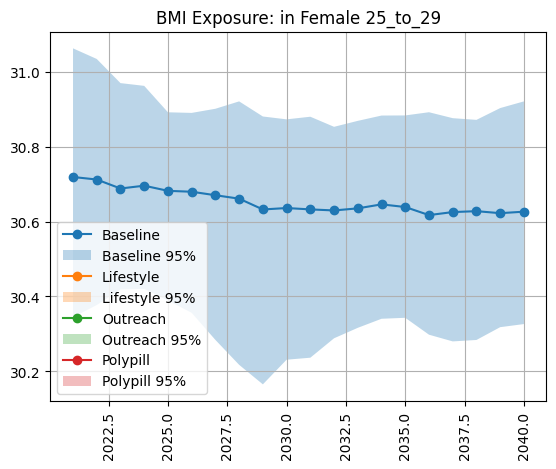

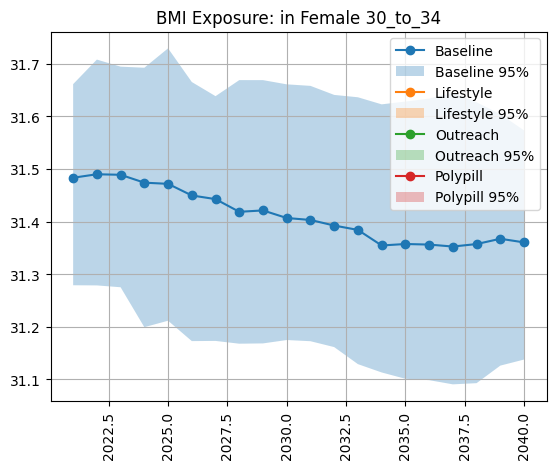

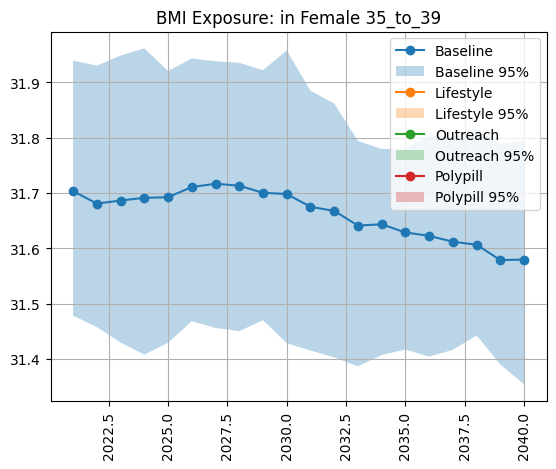

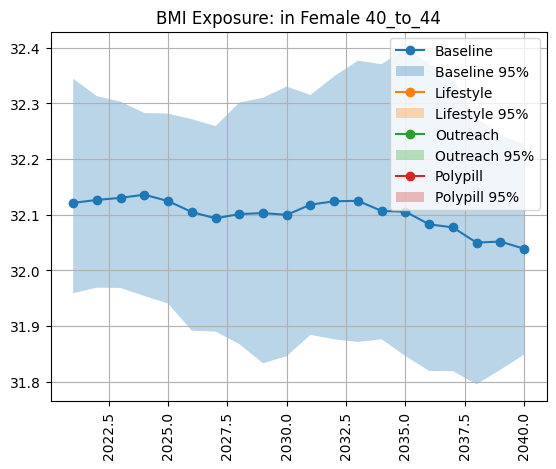

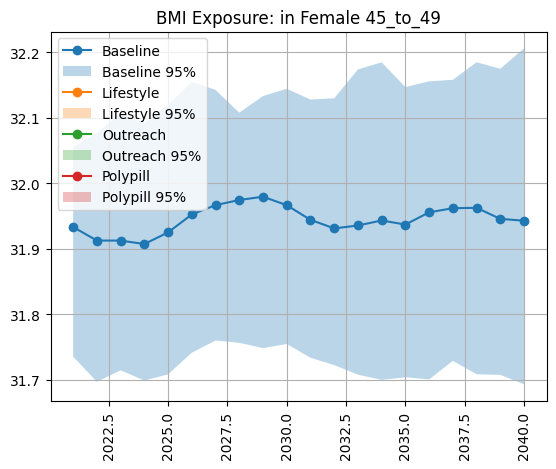

...

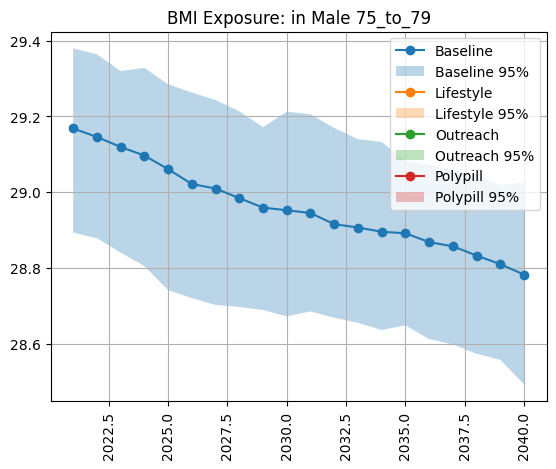

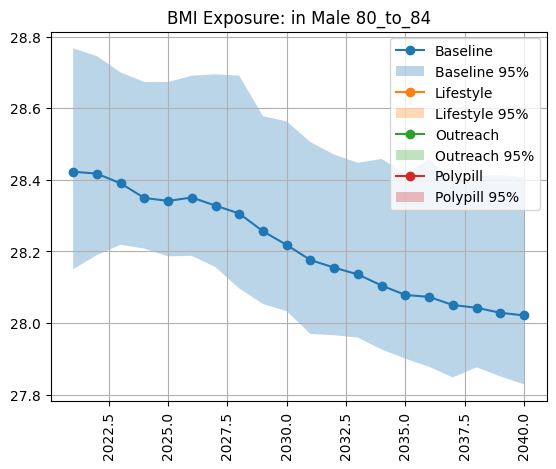

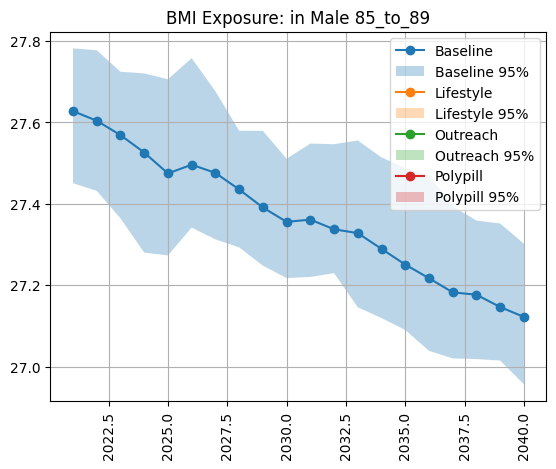

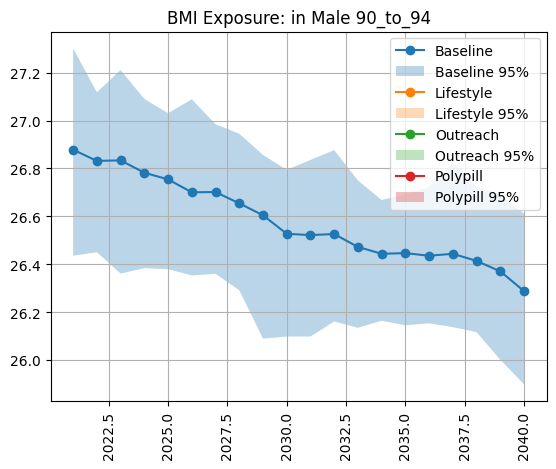

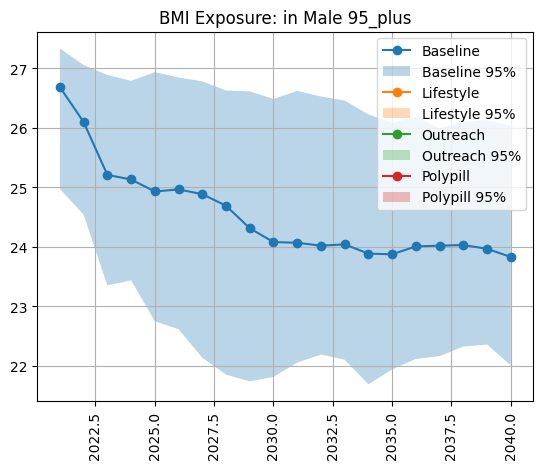

In [8]:
#%%capture
for sex in bmi_exp_rate_summ.sex.unique():
    for age in bmi_exp_rate_summ.age.unique():
        plt.figure() 
        subdata = bmi_exp_rate_summ.loc[(bmi_exp_rate_summ.sex==sex) & (bmi_exp_rate_summ.age==age) & (bmi_exp_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ.loc[(bmi_exp_rate_summ.sex==sex) & (bmi_exp_rate_summ.age==age) & (bmi_exp_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ.loc[(bmi_exp_rate_summ.sex==sex) & (bmi_exp_rate_summ.age==age) & (bmi_exp_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ.loc[(bmi_exp_rate_summ.sex==sex) & (bmi_exp_rate_summ.age==age) & (bmi_exp_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'BMI Exposure: in {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(20,33)
        plt.grid()

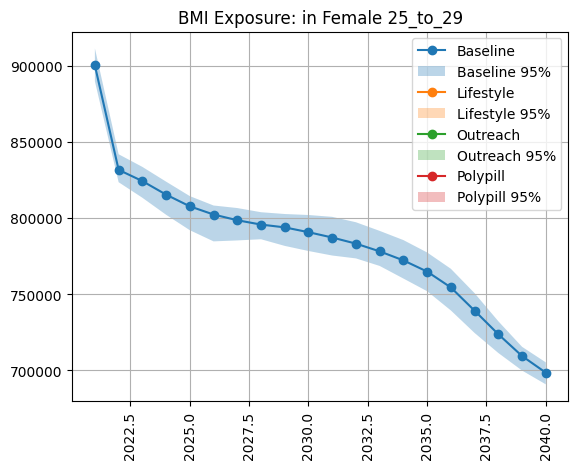

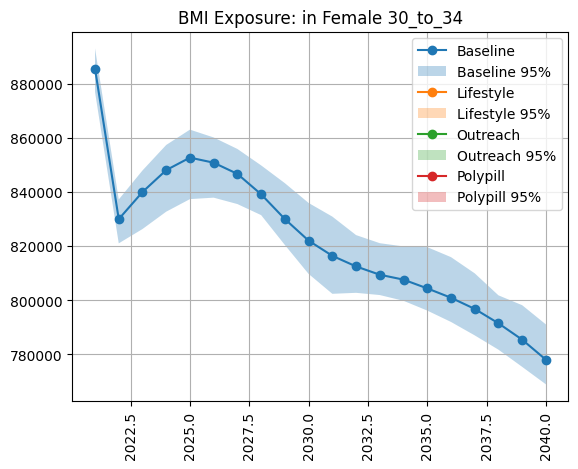

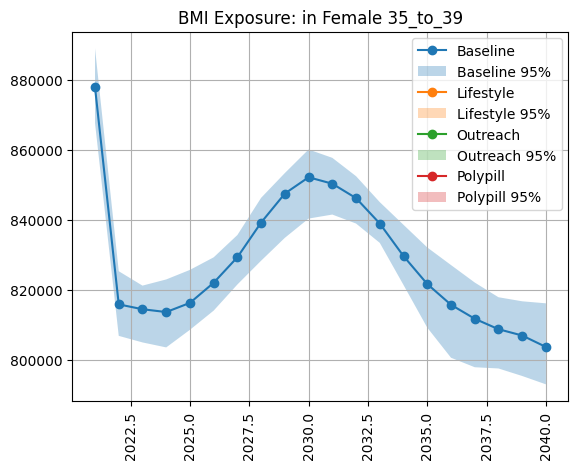

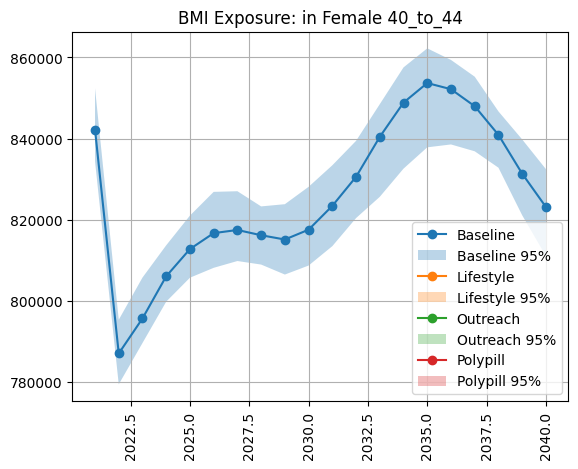

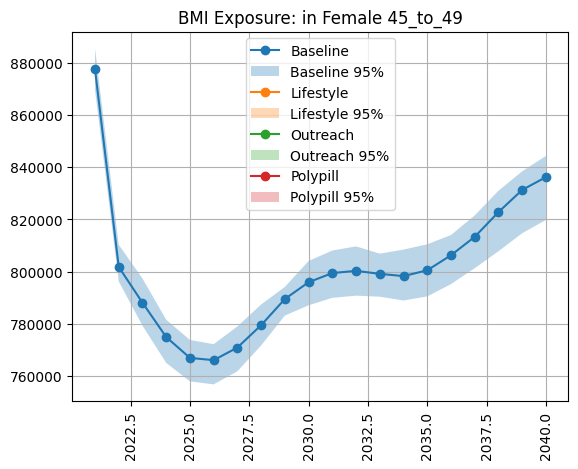

...

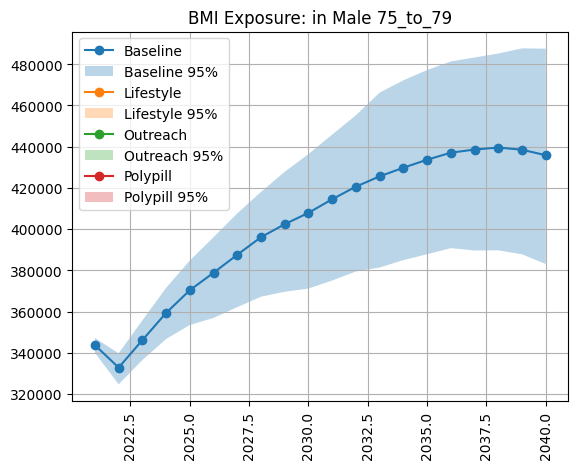

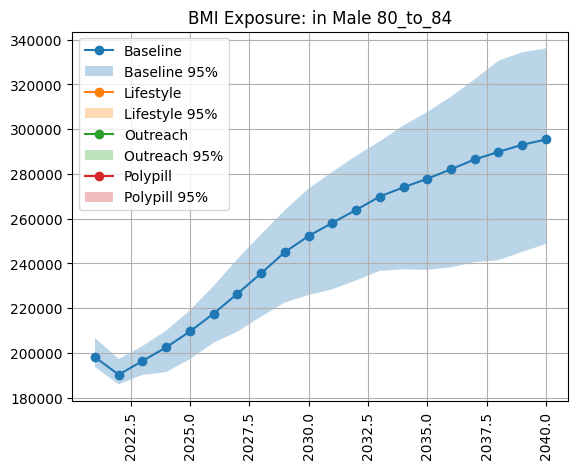

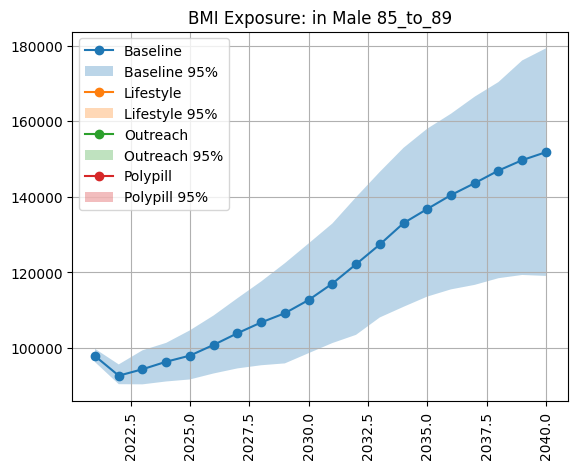

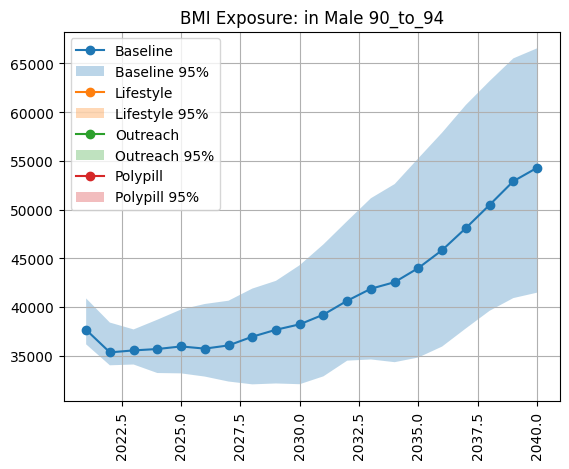

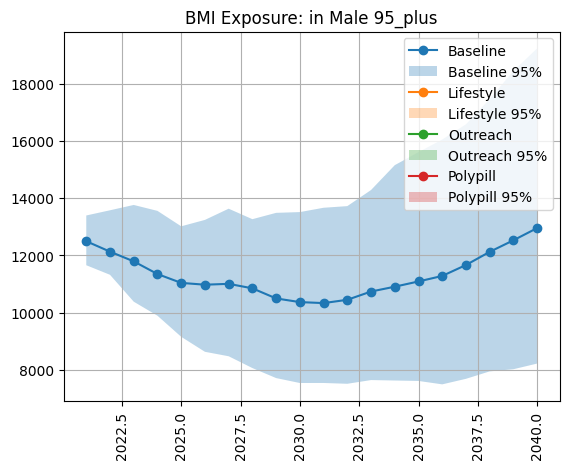

In [34]:
#%%capture
for sex in bmi_exp_rate_summ_bmi.sex.unique():
    for age in bmi_exp_rate_summ_bmi.age.unique():
        plt.figure() 
        subdata = bmi_exp_rate_summ_bmi.loc[(bmi_exp_rate_summ_bmi.sex==sex) & (bmi_exp_rate_summ_bmi.age==age) & (bmi_exp_rate_summ_bmi.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_bmi.loc[(bmi_exp_rate_summ_bmi.sex==sex) & (bmi_exp_rate_summ_bmi.age==age) & (bmi_exp_rate_summ_bmi.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_bmi.loc[(bmi_exp_rate_summ_bmi.sex==sex) & (bmi_exp_rate_summ_bmi.age==age) & (bmi_exp_rate_summ_bmi.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_bmi.loc[(bmi_exp_rate_summ_bmi.sex==sex) & (bmi_exp_rate_summ_bmi.age==age) & (bmi_exp_rate_summ_bmi.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'BMI Exposure: in {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(20,33)
        plt.grid()

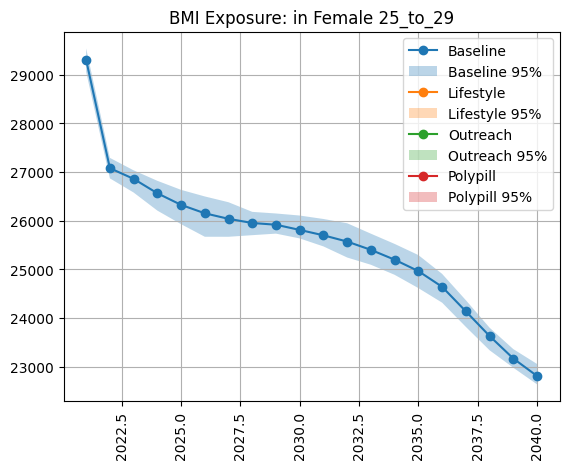

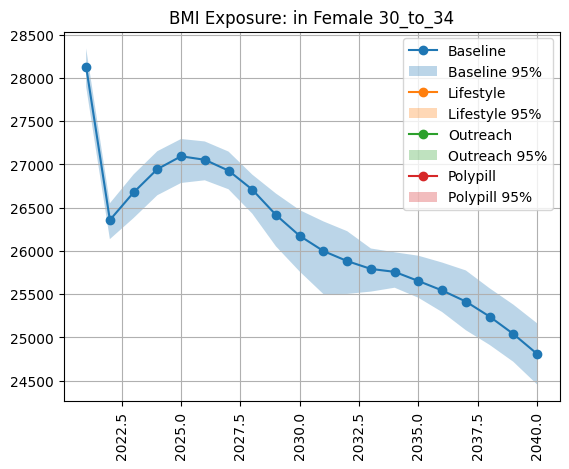

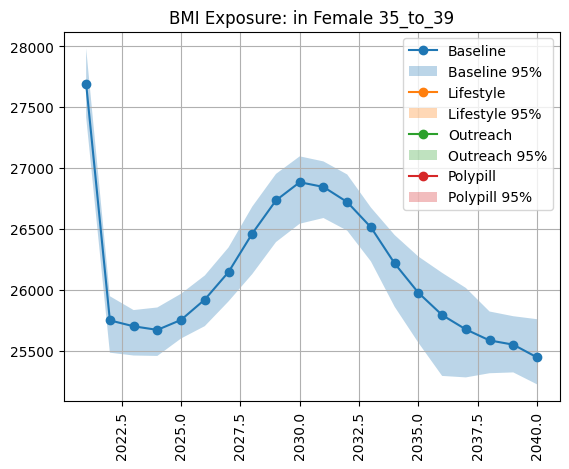

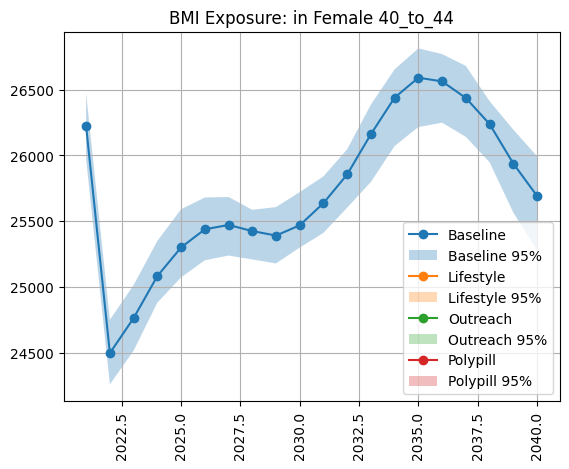

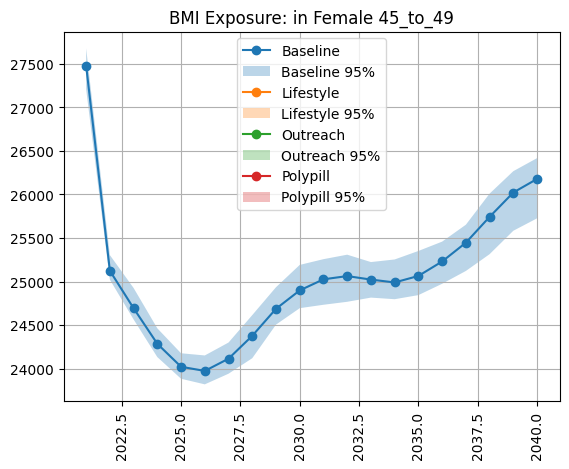

...

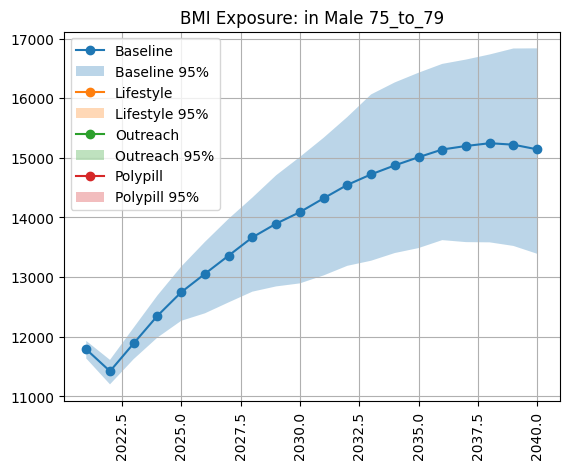

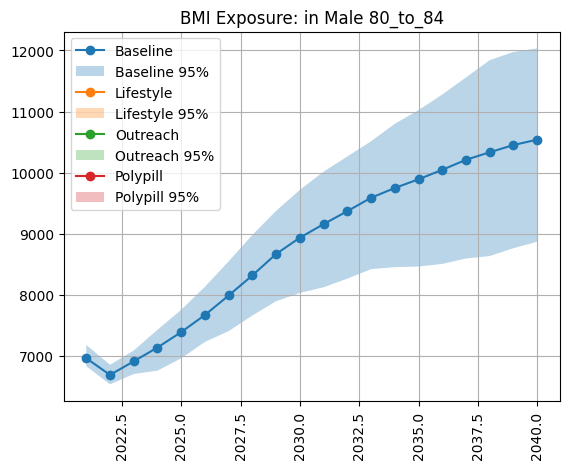

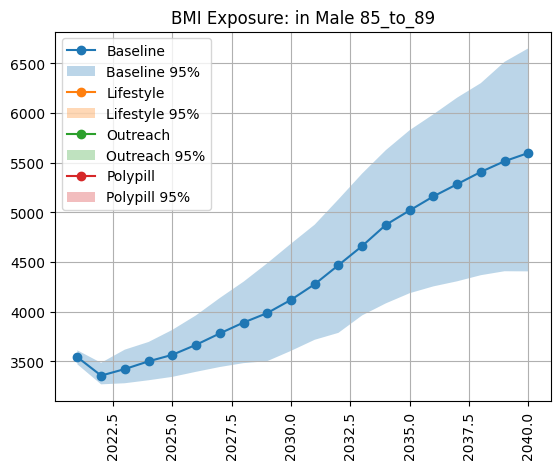

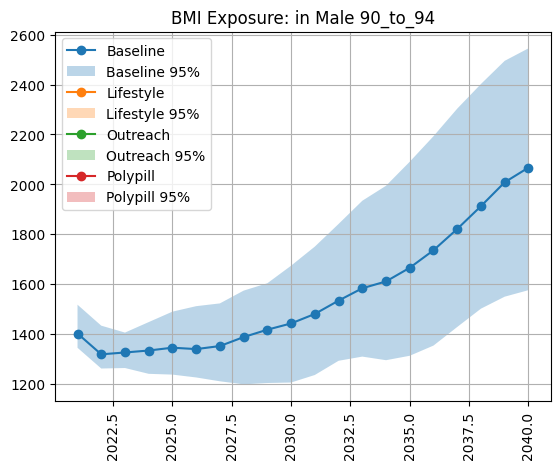

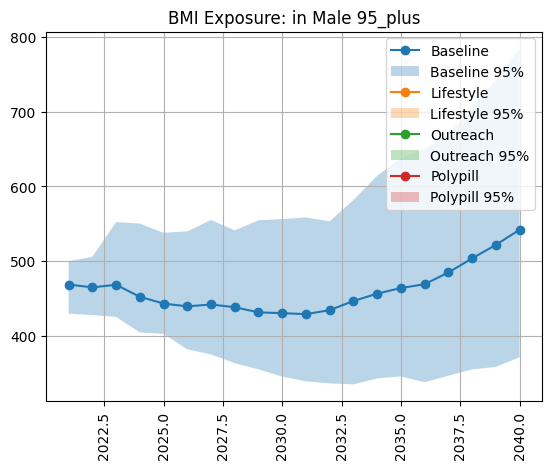

In [35]:
#%%capture
for sex in bmi_exp_rate_summ_ptvalue.sex.unique():
    for age in bmi_exp_rate_summ_ptvalue.age.unique():
        plt.figure() 
        subdata = bmi_exp_rate_summ_ptvalue.loc[(bmi_exp_rate_summ_ptvalue.sex==sex) & (bmi_exp_rate_summ_ptvalue.age==age) & (bmi_exp_rate_summ_ptvalue.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_ptvalue.loc[(bmi_exp_rate_summ_ptvalue.sex==sex) & (bmi_exp_rate_summ_ptvalue.age==age) & (bmi_exp_rate_summ_ptvalue.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_ptvalue.loc[(bmi_exp_rate_summ_ptvalue.sex==sex) & (bmi_exp_rate_summ_ptvalue.age==age) & (bmi_exp_rate_summ_ptvalue.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = bmi_exp_rate_summ_ptvalue.loc[(bmi_exp_rate_summ_ptvalue.sex==sex) & (bmi_exp_rate_summ_ptvalue.age==age) & (bmi_exp_rate_summ_ptvalue.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'BMI Exposure: in {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(20,33)
        plt.grid()

As expected, lifestyle is the only scenario with a real change in BMI. This is good as it is the only one that directly affects BMI and nothing is correlated yet! 

### SBP 

In [9]:
sbp_exp = risk_exp.loc[risk_exp['risk']=='high_systolic_blood_pressure']
sbp_exp_rate = sbp_exp.groupby(['age','sex','year','input_draw','scenario']).value.sum().reset_index()
sbp_exp_rate = pd.concat([sbp_exp_rate, per_time_group.ptvalue], axis=1)
sbp_exp_rate['sbp_rate'] = sbp_exp_rate['value'] / sbp_exp_rate['ptvalue']
sbp_exp_rate_summ = (sbp_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .sbp_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
sbp_exp_rate_summ.head()

,age,sex,year,scenario,mean,2.5%,97.5%
0,25_to_29,Female,2021,baseline,110.094455,107.875029,112.883732
1,25_to_29,Female,2022,baseline,110.026148,107.854907,112.743282
2,25_to_29,Female,2023,baseline,109.931650,107.751533,112.650339
3,25_to_29,Female,2024,baseline,109.936979,107.786881,112.585548
4,25_to_29,Female,2025,baseline,109.894888,107.762796,112.516861


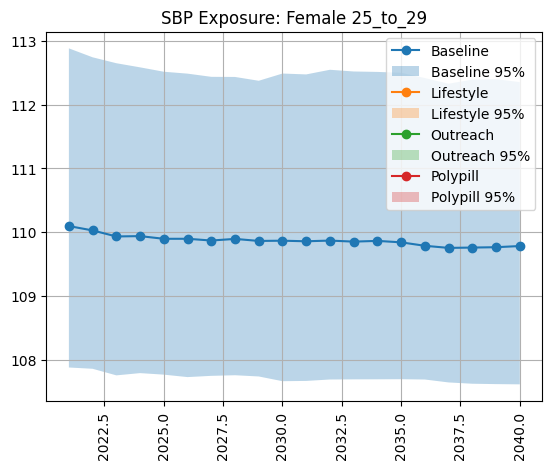

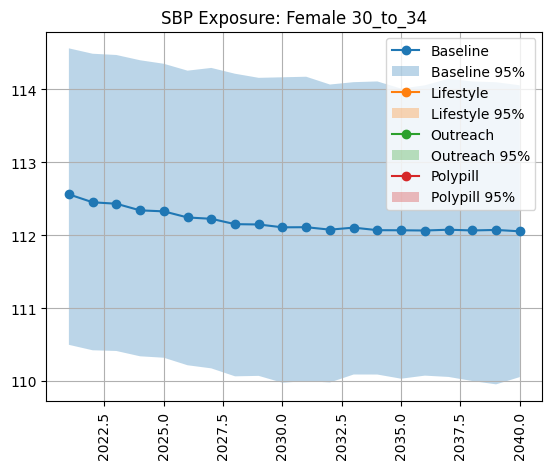

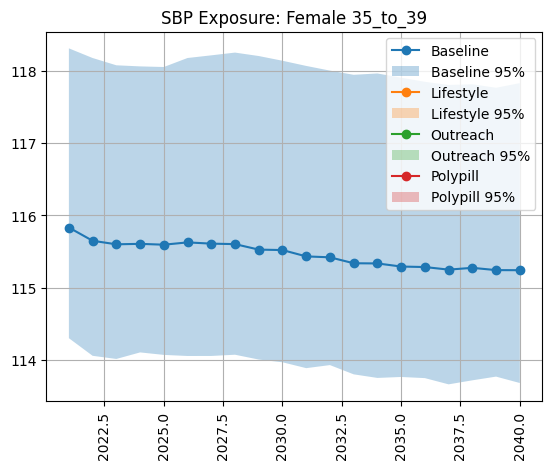

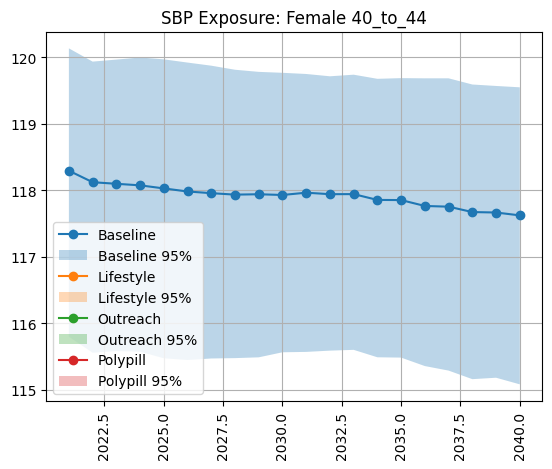

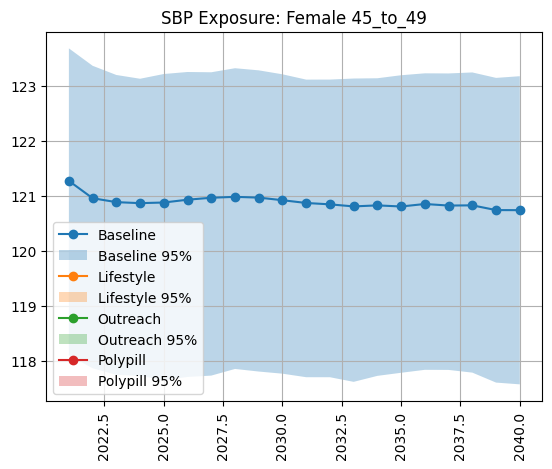

...

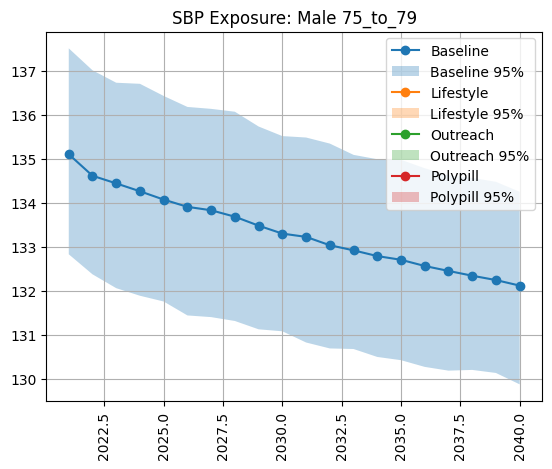

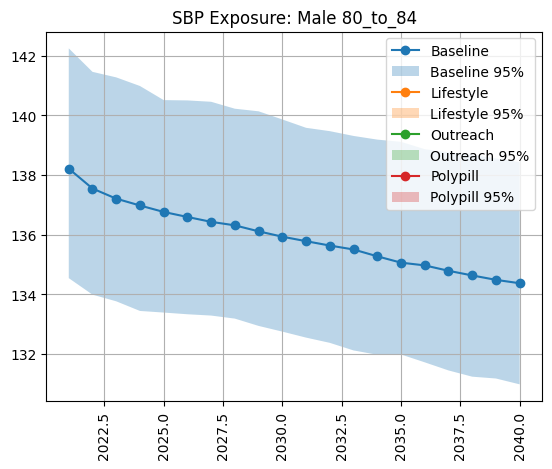

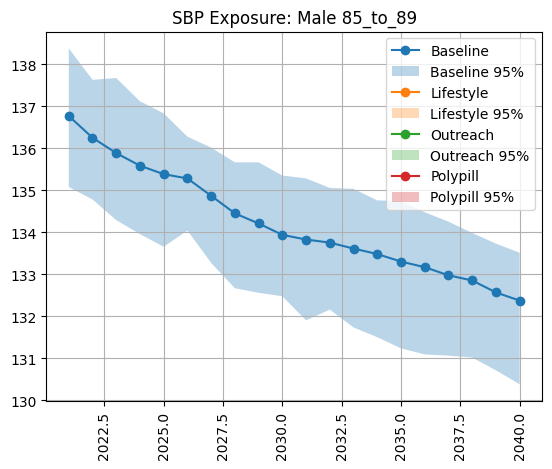

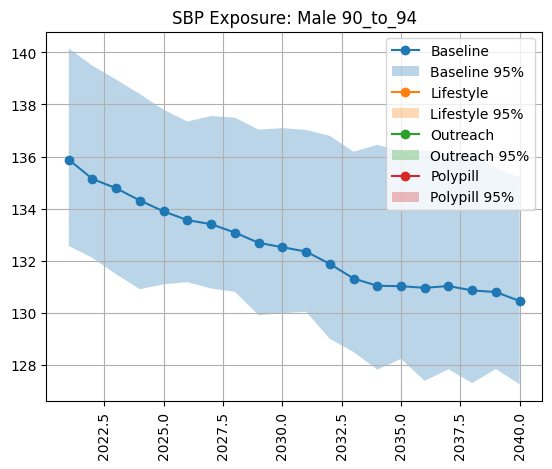

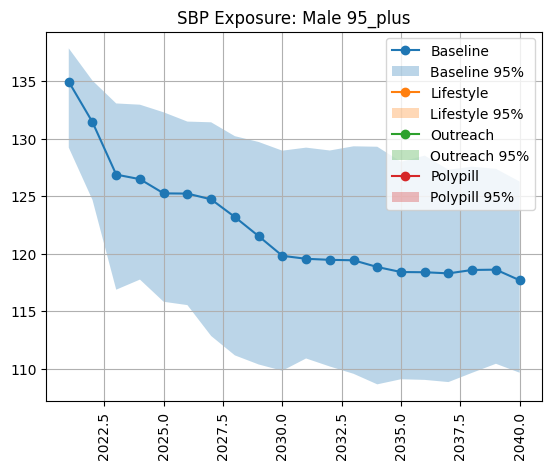

In [10]:
#%%capture
for sex in sbp_exp_rate_summ.sex.unique():
    for age in sbp_exp_rate_summ.age.unique():
        plt.figure() 
        subdata = sbp_exp_rate_summ.loc[(sbp_exp_rate_summ.sex==sex) & (sbp_exp_rate_summ.age==age) & (sbp_exp_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = sbp_exp_rate_summ.loc[(sbp_exp_rate_summ.sex==sex) & (sbp_exp_rate_summ.age==age) & (sbp_exp_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = sbp_exp_rate_summ.loc[(sbp_exp_rate_summ.sex==sex) & (sbp_exp_rate_summ.age==age) & (sbp_exp_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = sbp_exp_rate_summ.loc[(sbp_exp_rate_summ.sex==sex) & (sbp_exp_rate_summ.age==age) & (sbp_exp_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'SBP Exposure: {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(0,100000)
        plt.grid()

Polypill and outreach have a visible impact on SBP as expected. Lifestyle has a slight effect as expected. 

### LDL-C

In [11]:
ldl_exp = risk_exp.loc[risk_exp['risk']=='high_ldl_cholesterol']
ldl_exp_rate = ldl_exp.groupby(['age','sex','year','input_draw','scenario']).value.sum().reset_index()
ldl_exp_rate = pd.concat([ldl_exp_rate, per_time_group.ptvalue], axis=1)
ldl_exp_rate['ldl_rate'] = ldl_exp_rate['value'] / ldl_exp_rate['ptvalue']
ldl_exp_rate_summ = (ldl_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .ldl_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
ldl_exp_rate_summ.head()

,age,sex,year,scenario,mean,2.5%,97.5%
0,25_to_29,Female,2021,baseline,2.632280,2.548281,2.805816
1,25_to_29,Female,2022,baseline,2.632303,2.546294,2.804884
2,25_to_29,Female,2023,baseline,2.631205,2.545345,2.805793
3,25_to_29,Female,2024,baseline,2.630732,2.546900,2.805067
4,25_to_29,Female,2025,baseline,2.629039,2.544691,2.797943


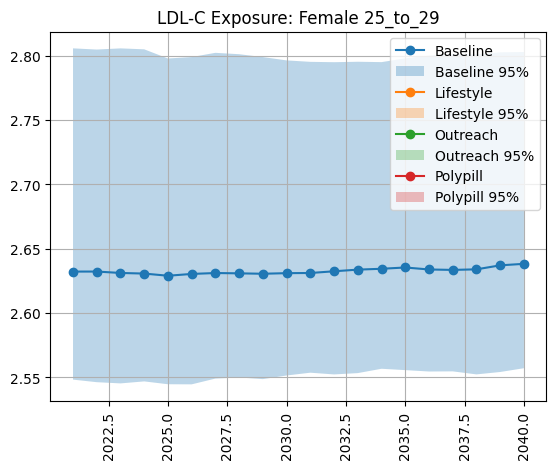

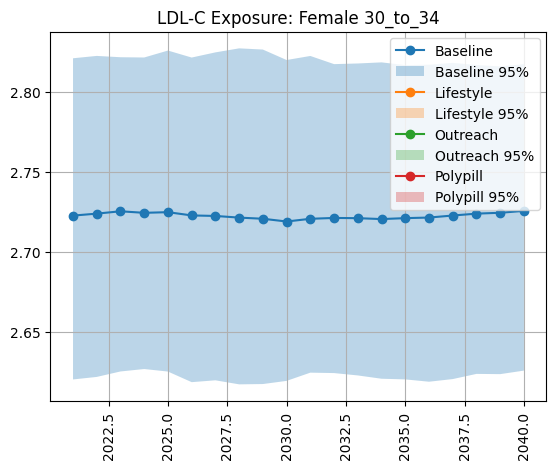

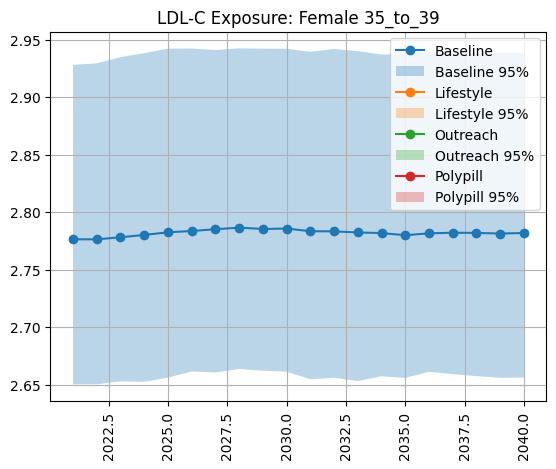

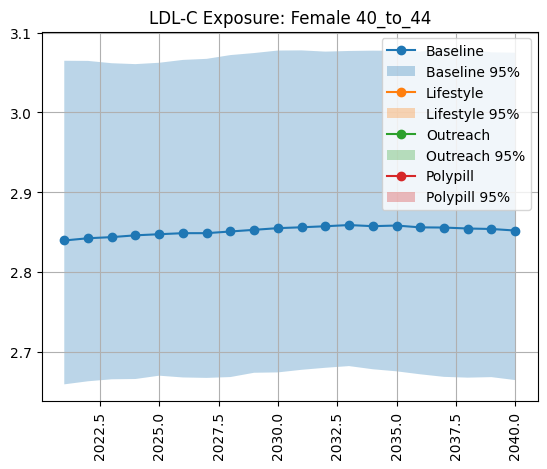

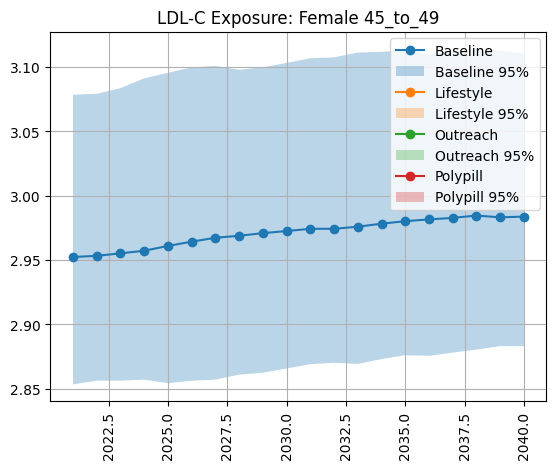

...

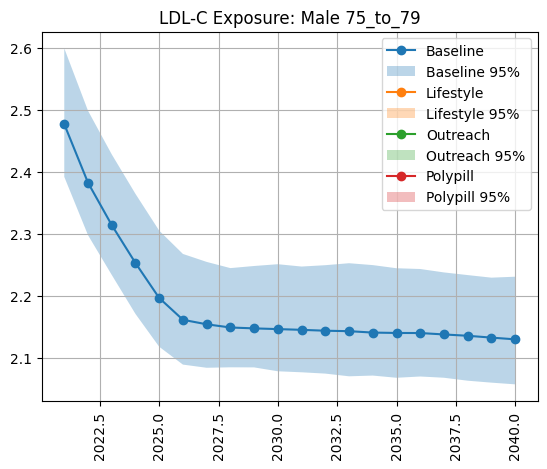

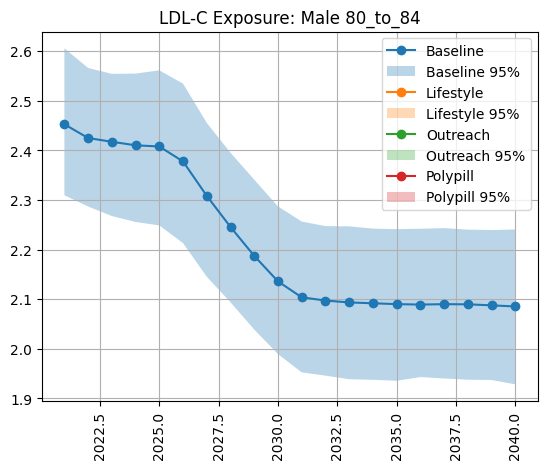

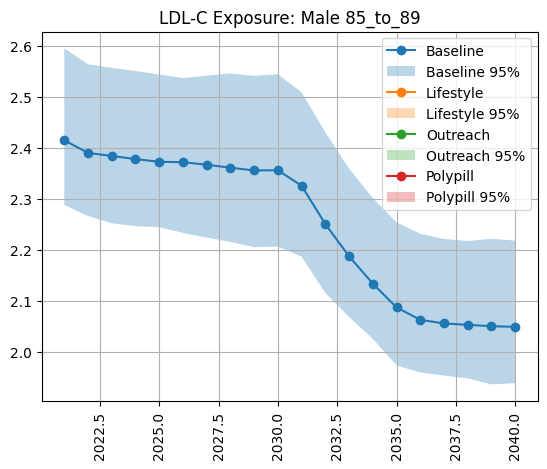

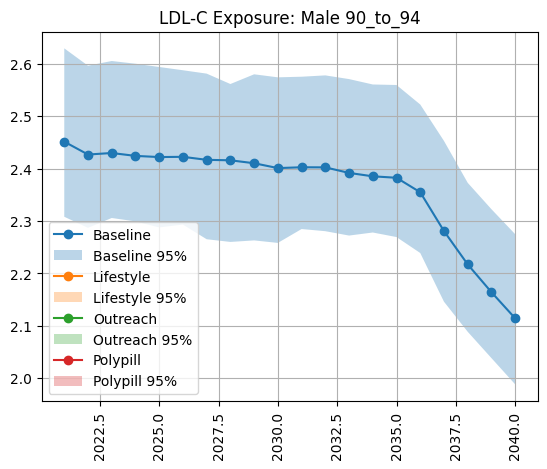

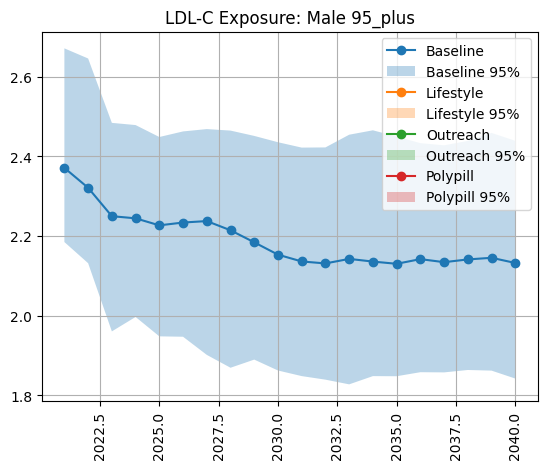

In [12]:
#%%capture
for sex in ldl_exp_rate_summ.sex.unique():
    for age in ldl_exp_rate_summ.age.unique():
        plt.figure() 
        subdata = ldl_exp_rate_summ.loc[(ldl_exp_rate_summ.sex==sex) & (ldl_exp_rate_summ.age==age) & (ldl_exp_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = ldl_exp_rate_summ.loc[(ldl_exp_rate_summ.sex==sex) & (ldl_exp_rate_summ.age==age) & (ldl_exp_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = ldl_exp_rate_summ.loc[(ldl_exp_rate_summ.sex==sex) & (ldl_exp_rate_summ.age==age) & (ldl_exp_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = ldl_exp_rate_summ.loc[(ldl_exp_rate_summ.sex==sex) & (ldl_exp_rate_summ.age==age) & (ldl_exp_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'LDL-C Exposure: {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(0,100000)
        plt.grid()

Outreach has the biggest impact. This makes sense with the not yet fixed issues of LDL meds in older adults. Should recheck once those are fixed. 

### FPG

In [13]:
fpg_exp = risk_exp.loc[risk_exp['risk']=='high_fasting_plasma_glucose']
fpg_exp_rate = fpg_exp.groupby(['age','sex','year','input_draw','scenario']).value.sum().reset_index()
fpg_exp_rate = pd.concat([fpg_exp_rate, per_time_group.ptvalue], axis=1)
fpg_exp_rate['fpg_rate'] = fpg_exp_rate['value'] / fpg_exp_rate['ptvalue']
fpg_exp_rate_summ = (fpg_exp_rate
                .groupby(['age', 'sex', 'year','scenario'])
                .fpg_rate.describe(percentiles=[.025, .975])
                .filter(['mean', '2.5%', '97.5%'])
                .reset_index())
fpg_exp_rate_summ.head()

,age,sex,year,scenario,mean,2.5%,97.5%
0,25_to_29,Female,2021,baseline,5.338994,4.833338,6.196757
1,25_to_29,Female,2022,baseline,5.341273,4.832974,6.198388
2,25_to_29,Female,2023,baseline,5.338306,4.830547,6.190896
3,25_to_29,Female,2024,baseline,5.339124,4.832658,6.192846
4,25_to_29,Female,2025,baseline,5.338434,4.832595,6.192595


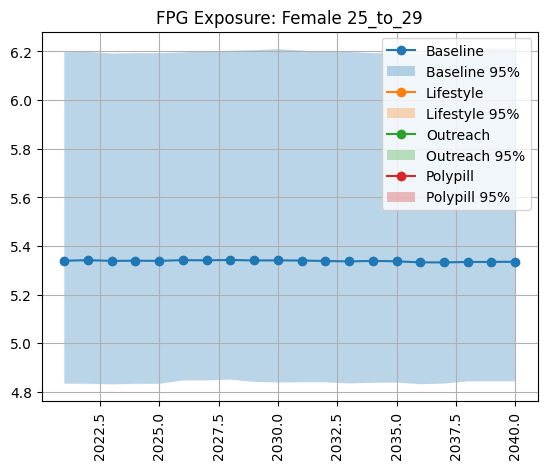

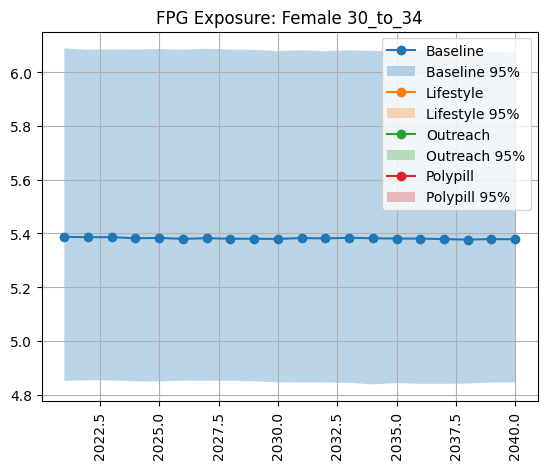

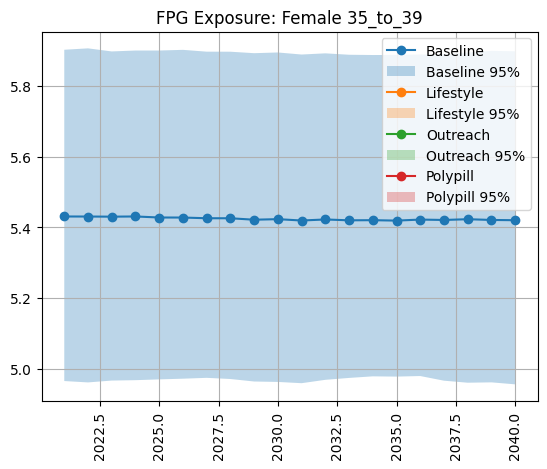

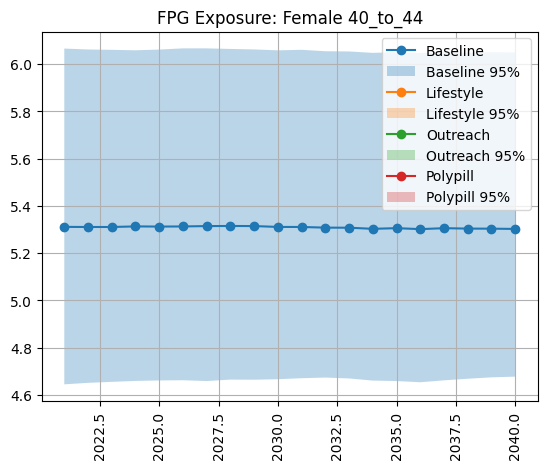

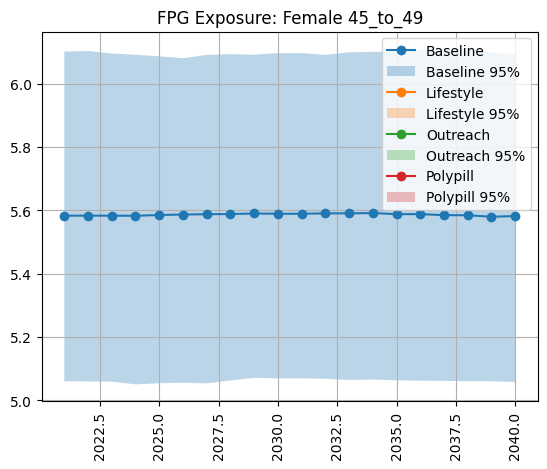

...

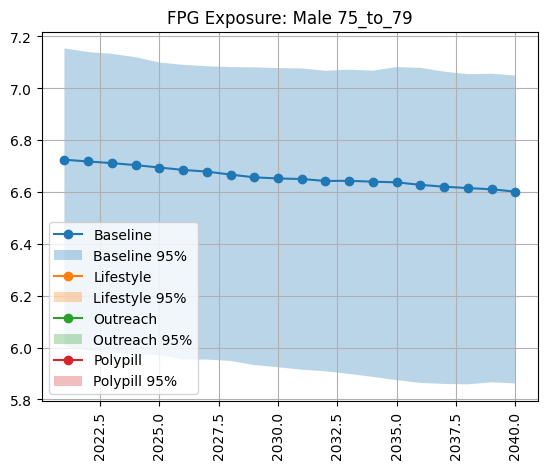

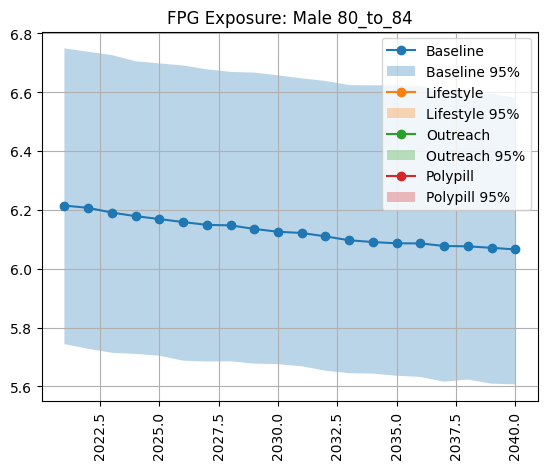

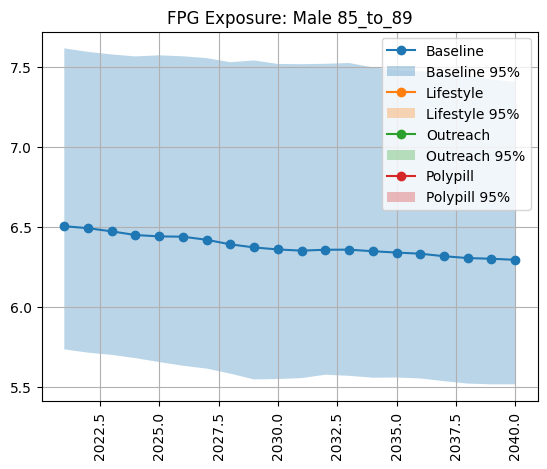

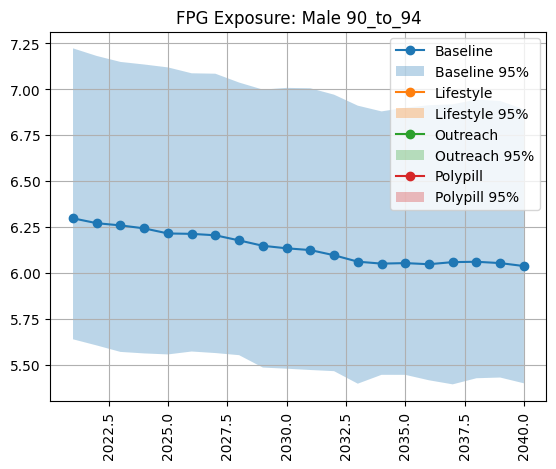

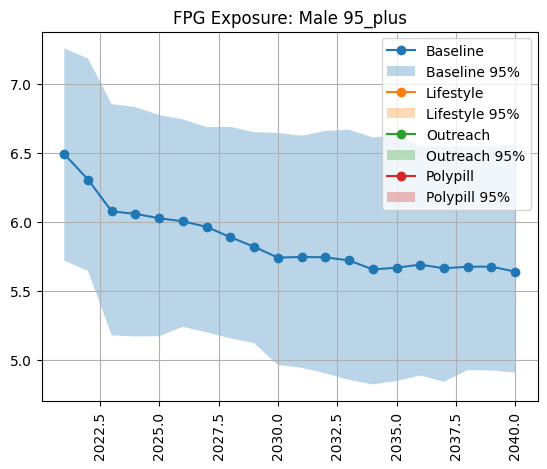

In [14]:
#%%capture
for sex in fpg_exp_rate_summ.sex.unique():
    for age in fpg_exp_rate_summ.age.unique():
        plt.figure() 
        subdata = fpg_exp_rate_summ.loc[(fpg_exp_rate_summ.sex==sex) & (fpg_exp_rate_summ.age==age) & (fpg_exp_rate_summ.scenario=='baseline')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = fpg_exp_rate_summ.loc[(fpg_exp_rate_summ.sex==sex) & (fpg_exp_rate_summ.age==age) & (fpg_exp_rate_summ.scenario=='lifestyle_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = fpg_exp_rate_summ.loc[(fpg_exp_rate_summ.sex==sex) & (fpg_exp_rate_summ.age==age) & (fpg_exp_rate_summ.scenario=='outreach_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        subdata = fpg_exp_rate_summ.loc[(fpg_exp_rate_summ.sex==sex) & (fpg_exp_rate_summ.age==age) & (fpg_exp_rate_summ.scenario=='polypill_100')]
        plt.plot(subdata['year'], subdata['mean'], marker='o')
        plt.fill_between(subdata['year'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
        plt.legend(['Baseline','Baseline 95%','Lifestyle','Lifestyle 95%','Outreach','Outreach 95%','Polypill','Polypill 95%'])
        plt.title(f'FPG Exposure: {sex} {age}') 
        plt.xticks(rotation=90) 
        #plt.ylim(0,100000)
        plt.grid()

Very modest improvments for lifestyle intervention. 

## Comparison to Artifacts

In [15]:
ls /mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/51-locations/v3-20231013/

README                    kentucky.hdf        north_dakota.hdf
alabama.hdf               logs/               ohio.hdf
alaska.hdf                louisiana.hdf       oklahoma.hdf
arizona.hdf               maine.hdf           oregon.hdf
arkansas.hdf              maryland.hdf        paf-calculations/
california.hdf            massachusetts.hdf   pennsylvania.hdf
colorado.hdf              michigan.hdf        rhode_island.hdf
connecticut.hdf           minnesota.hdf       south_carolina.hdf
delaware.hdf              mississippi.hdf     south_dakota.hdf
district_of_columbia.hdf  missouri.hdf        tennessee.hdf
florida.hdf               montana.hdf         texas.hdf
georgia.hdf               nebraska.hdf        utah.hdf
hawaii.hdf                nevada.hdf          vermont.hdf
idaho.hdf                 new_hampshire.hdf   virginia.hdf
illinois.hdf              new_jersey.hdf      washington.hdf
indiana.hdf               new_mexico.hdf      west_virginia.hdf
iowa.hdf                  new_york.

In [21]:
from vivarium import Artifact

#explore the artifact data (note age groups)
art = Artifact('/mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/alabama-vv-mediation.hdf', filter_terms=['year_start == 2019', 'age_start >=  25'])

In [17]:
#art.keys

In [22]:
locations = ['alabama']

In [23]:
def load_artifact_data(word:str, cause:str, measure:str):
    master_art_data = pd.DataFrame()
    for i in locations: #in case there are other countries
        
        # grab main artifact object
        art = Artifact('/mnt/team/simulation_science/costeffectiveness/artifacts/vivarium_nih_us_cvd/alabama-vv-mediation.hdf', 
                   filter_terms=['year_start == 2019', 'age_start >=  25']) # << MIGHT WANT TO CHANGE THESE TERMS
        
        # load requested measure
        data = art.load(word + '.' + cause + '.' + measure)
        #data = data[['draw_29','draw_232','draw_357','draw_394','draw_602','draw_629','draw_650','draw_680','draw_829','draw_949']]

        # collapse to desired percentiles
        data = data.apply(pd.DataFrame.describe, percentiles=[0.025, 0.5, 0.975], axis=1).filter(['mean', '50%', '2.5%', '97.5%']).reset_index()
        
        # formatting (may want to format age as well)
        data['location'] = i#.capitalize()
        data['measure'] = measure
        #data['sex'] = np.where(data['sex'] == 'Female', 'female', 'male')
    
   
        master_art_data = master_art_data.append(data)
        
    return master_art_data

### BMI

In [24]:
bmi_art = load_artifact_data('risk_factor', 'high_body_mass_index_in_adults', 'exposure')
bmi_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(bmi_art.age_start,bmi_art.age_end)]
bmi_art.head()

,sex,age_start,age_end,year_start,year_end,parameter,mean,50%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,30.899912,30.892990,30.572156,31.233780,alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,31.636913,31.638236,31.293987,31.989474,alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,31.883495,31.884883,31.555235,32.210906,alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,32.130649,32.123262,31.801051,32.462829,alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,32.169931,32.165649,31.855765,32.505542,alabama,exposure,45_to_49


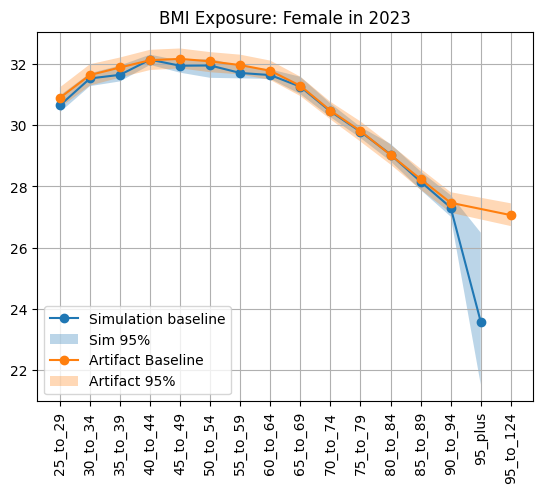

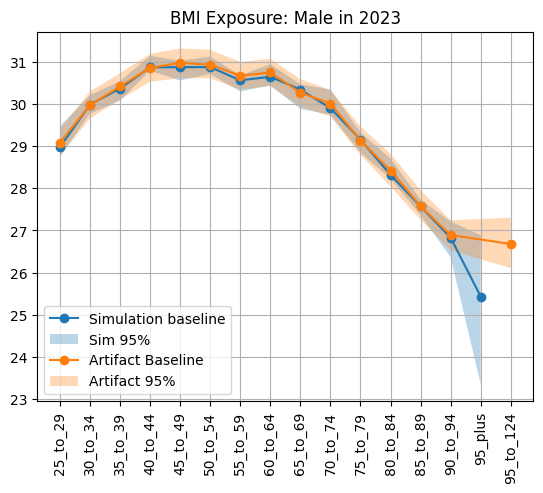

In [25]:
for sex in bmi_exp_rate_summ.sex.unique():
    plt.figure() 
    subdata = bmi_exp_rate_summ.loc[(bmi_exp_rate_summ.sex==sex) & (bmi_exp_rate_summ.year==2023) & (bmi_exp_rate_summ.scenario == 'baseline')]
    plt.plot(subdata['age'], subdata['50%'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = bmi_art.loc[(bmi_art.sex==sex) & (bmi_art.year_end==2020)]
    plt.plot(subdata2['age_group'], subdata2['50%'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'BMI Exposure: {sex} in 2023') 
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 

### SBP

In [26]:
sbp_art = load_artifact_data('risk_factor', 'high_systolic_blood_pressure', 'exposure')
sbp_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(sbp_art.age_start,sbp_art.age_end)]
sbp_art.head()

,sex,age_start,age_end,year_start,year_end,parameter,mean,50%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,110.635893,110.623634,107.945700,113.550750,alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,112.876275,112.881309,110.098198,115.523727,alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,116.139886,116.134678,113.594023,118.770064,alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,118.491616,118.514616,115.903577,121.039457,alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,121.645391,121.618436,118.875235,124.529834,alabama,exposure,45_to_49


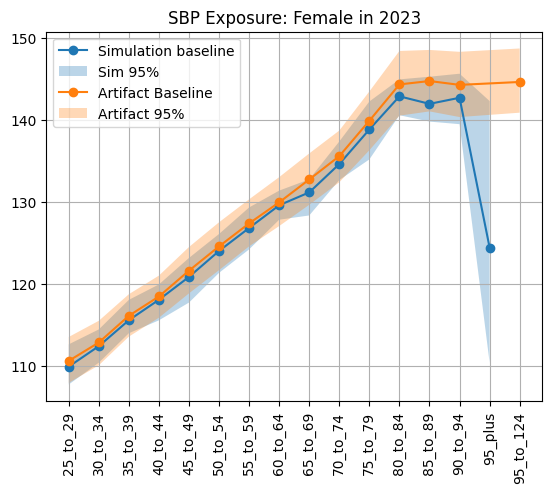

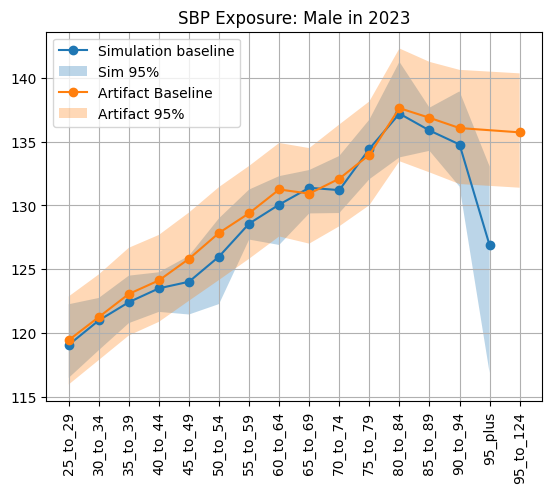

In [27]:
for sex in sbp_exp_rate_summ.sex.unique():
    plt.figure() 
    subdata = sbp_exp_rate_summ.loc[(sbp_exp_rate_summ.sex==sex) & (sbp_exp_rate_summ.year==2023) & (sbp_exp_rate_summ.scenario == 'baseline')]
    plt.plot(subdata['age'], subdata['mean'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = sbp_art.loc[(sbp_art.sex==sex) & (sbp_art.year_end==2020)]
    plt.plot(subdata2['age_group'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'SBP Exposure: {sex} in 2023')
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 

### LDL-C

In [28]:
ldl_art = load_artifact_data('risk_factor', 'high_ldl_cholesterol', 'exposure')
ldl_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(ldl_art.age_start,ldl_art.age_end)]
ldl_art.head()

,sex,age_start,age_end,year_start,year_end,parameter,mean,50%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,2.639862,2.638003,2.472574,2.821188,alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,2.724353,2.723671,2.553736,2.905134,alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,2.802925,2.801341,2.639513,2.972487,alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,2.880791,2.878250,2.721814,3.039119,alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,2.998297,2.995129,2.837974,3.175367,alabama,exposure,45_to_49


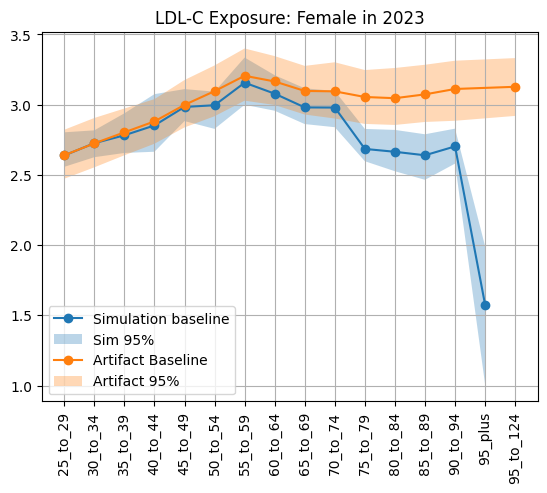

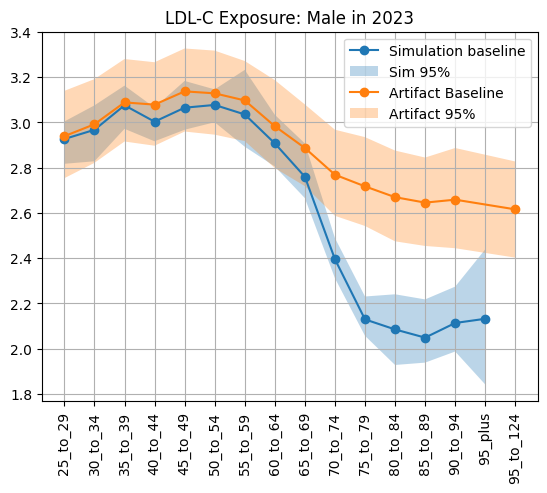

In [29]:
for sex in ldl_exp_rate_summ.sex.unique():
    plt.figure() 
    subdata = ldl_exp_rate_summ.loc[(ldl_exp_rate_summ.sex==sex) & (ldl_exp_rate_summ.year==2040) & (ldl_exp_rate_summ.scenario == 'baseline')]
    plt.plot(subdata['age'], subdata['mean'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = ldl_art.loc[(ldl_art.sex==sex) & (ldl_art.year_end==2020)]
    plt.plot(subdata2['age_group'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'LDL-C Exposure: {sex} in 2023') 
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 

### FPG

In [30]:
fpg_art = load_artifact_data('risk_factor', 'high_fasting_plasma_glucose', 'exposure')
fpg_art['age_group'] = [f'{int(i)}_to_{int(j) - 1}' for (i,j) in zip(fpg_art.age_start,fpg_art.age_end)]
fpg_art.head()

,sex,age_start,age_end,year_start,year_end,parameter,mean,50%,2.5%,97.5%,location,measure,age_group
0,Female,25.0,30.0,2019,2020,continuous,5.316303,5.307507,4.613215,6.137399,alabama,exposure,25_to_29
1,Female,30.0,35.0,2019,2020,continuous,5.461718,5.447329,4.696085,6.297658,alabama,exposure,30_to_34
2,Female,35.0,40.0,2019,2020,continuous,5.538952,5.538472,4.750516,6.371252,alabama,exposure,35_to_39
3,Female,40.0,45.0,2019,2020,continuous,5.659873,5.650779,4.873814,6.494619,alabama,exposure,40_to_44
4,Female,45.0,50.0,2019,2020,continuous,5.787248,5.771666,5.004493,6.682187,alabama,exposure,45_to_49


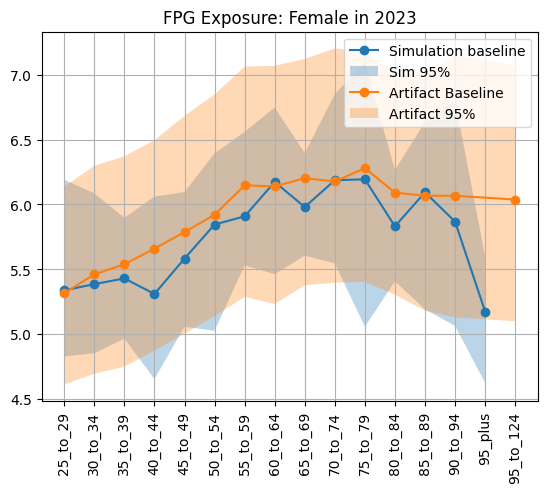

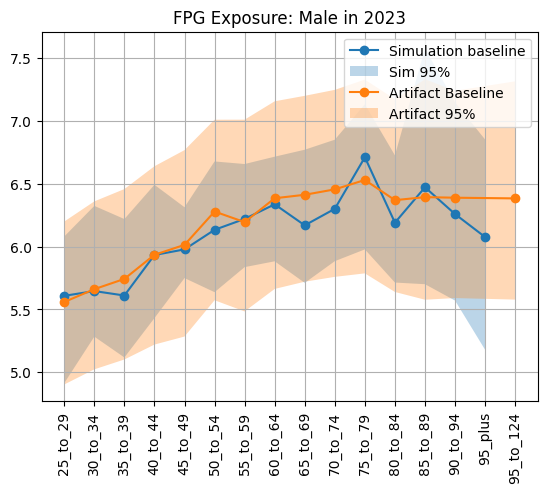

In [31]:
for sex in fpg_exp_rate_summ.sex.unique():
    plt.figure() 
    subdata = fpg_exp_rate_summ.loc[(fpg_exp_rate_summ.sex==sex) & (fpg_exp_rate_summ.year==2023) & (fpg_exp_rate_summ.scenario == 'baseline')]
    plt.plot(subdata['age'], subdata['mean'], marker='o')
    plt.fill_between(subdata['age'], subdata['2.5%'], subdata['97.5%'], alpha=.3)
    subdata2 = fpg_art.loc[(fpg_art.sex==sex) & (fpg_art.year_end==2020)]
    plt.plot(subdata2['age_group'], subdata2['mean'], marker='o')
    plt.fill_between(subdata2['age_group'], subdata2['2.5%'], subdata2['97.5%'], alpha=.3)
    plt.title(f'FPG Exposure: {sex} in 2023')
    plt.xticks(rotation=90) 
    #plt.ylim(0,100000)
    plt.grid()
    plt.legend(['Simulation baseline', 'Sim 95%', 'Artifact Baseline', 'Artifact 95%']) 

Very interestingly (and almost worse overall) FPG is working great while the other 3 are looking bad